## Penentuan Rute evakuasi Optimal di Daerah Bencana Alam Menggunakan Algoritma Djikstra dan A*(Kabupaten Cilacap)

Kelompok 17:

Muhammad Fabyan Putroagung 	23031554029 

Akhmad Alviantio 	23031554238 


Langkah pertama yaitu mengambil data lokasi evakuasi kabupaten cilacap menggunakan metode scraping pada website BPBD 
https://sipotensiben.bpbd.cilacapkab.go.id/home/print2

In [1]:
import requests
from bs4 import BeautifulSoup


url = "https://sipotensiben.bpbd.cilacapkab.go.id/home/print2"


response = requests.get(url)
response.raise_for_status() 

soup = BeautifulSoup(response.content, 'html.parser')

table = soup.find('table', {'class': 'table table-bordered table-striped'})

data = []
if table:
    rows = table.find_all('tr')
    for row in rows:
        cols = row.find_all('td')
        cols = [col.text.strip() for col in cols]
        if cols:
            data.append(cols)

for item in data:
    print(item)


['1', 'BPBD Kabupaten Cilacap', 'Jl. Swadaya No.20, Pendowo, Tambakreja, Kec. Cilacap Sel., Kabupaten Cilacap, Jawa Tengah 53211', '132', '460', 'Lantai 2', '533520']
['2', 'SMP N 1 Cilacap', 'Jl. Jend. Ahmad Yani No.15, Bonduren, Tambakreja, Kec. Cilacap Sel., Kabupaten Cilacap, Jawa Tengah 53211', '1491', '970', 'Lantai 1 - 4', '531133']
['3', 'Politeknik Negeri Cilacap', 'Jalan Dokter Soetomo No.1, Karangcengis, Sidakaya, Kec. Cilacap Sel., Kabupaten Cilacap, Jawa Tengah 53212', '5292', '17640', 'Lantai 3 + Lantai 4', '520717']
['4', 'RSUD Cilacap', 'Jl. Gatot Subroto No.28, Tambaksari, Sidanegara, Kec. Cilacap Tengah, Kabupaten Cilacap, Jawa Tengah 53223', '0', '600', 'Lantai 2', '535233']
['5', 'Akbid Graha Mandiri', 'Jalan Dokter Soetomo No:4 - B, Sidakaya Dua, Sidakaya, Kec. Cilacap Sel., Kabupaten Cilacap, Jawa Tengah 52530', '560', '1866', 'Lantai 2', '534908']
['6', 'Asrama Putri Stikes Al-Irsyad', 'Jl.kinibalu,Sidanegara, Cilacap Tengah, Wanasari, Sidanegara, Kec. Cilacap Te

Lalu menyimpan data pada file csv

In [2]:
import csv
csv_file = 'data_cilacap.csv'

with open(csv_file, mode='w', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    header = ['No', 'Nama Lokasi', 'Alamat', 'Luas', 'Kapasitas', 'Keterangan', 'Nomor Telpon'] 
    writer.writerow(header)
    
    writer.writerows(data)

Data divisualisasikan menggunakan library pandas

In [1]:
import folium
import pandas as pd

data = 'data_cilacap copy.csv'
data = pd.read_csv(data, on_bad_lines='skip')
lokasi = data[['Nama Lokasi', 'Latitude', 'Longitude']]

map_folium = folium.Map((-7.7017286,109.0200808), zoom_start=13)

for i, row in lokasi.iterrows():
    loc = (row['Latitude'], row['Longitude'])
    folium.Marker(loc, popup=row['Nama Lokasi'], icon=folium.Icon(color='blue')).add_to(map_folium)

map_folium.save("map_evakuasi.html")

print("Peta evakuasi telah disimpan sebagai 'map_evakuasi.html'")

Peta evakuasi telah disimpan sebagai 'map_evakuasi.html'


Melakukan penentuan titik lokasi evakuasi terdekat dari titik awal menggunakan perhitungan jarak haversine

In [2]:
from math import radians, sin, cos, sqrt, atan2


def haversine_distance(coord1, coord2):
    R = 6371 
    lat1, lon1 = radians(coord1[1]), radians(coord1[0])
    lat2, lon2 = radians(coord2[1]), radians(coord2[0])
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c * 1000

TitikAwal = (109.033863,-7.700656)

min_distance = float('inf')
TitikTerdekat = None

for index, row in data.iterrows():
    KoorEvakuasi = (row['Longitude'], row['Latitude'])
    distance = haversine_distance(TitikAwal, KoorEvakuasi)

    if distance < min_distance:
        min_distance = distance
        TitikTerdekat = row['Nama Lokasi']
        TitikTujuan = row['Latitude'],row['Longitude']
print(f"Titik evakuasi terdekat: {TitikTerdekat}")
print(TitikTujuan)

Titik evakuasi terdekat: BPBD Kabupaten Cilacap
(-7.7073066, 109.0245567)


Menggunakan library osmnx untuk mendapatkan jaringan jalan di kabupaten cilacap dengan menjadikan perempatan, pertigaan, belokan, dan jalan buntu sebagai node

c:\Users\fbkby\Latihan\.venv\Lib\site-packages\osmnx\graph.py:191: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  G = graph_from_bbox(


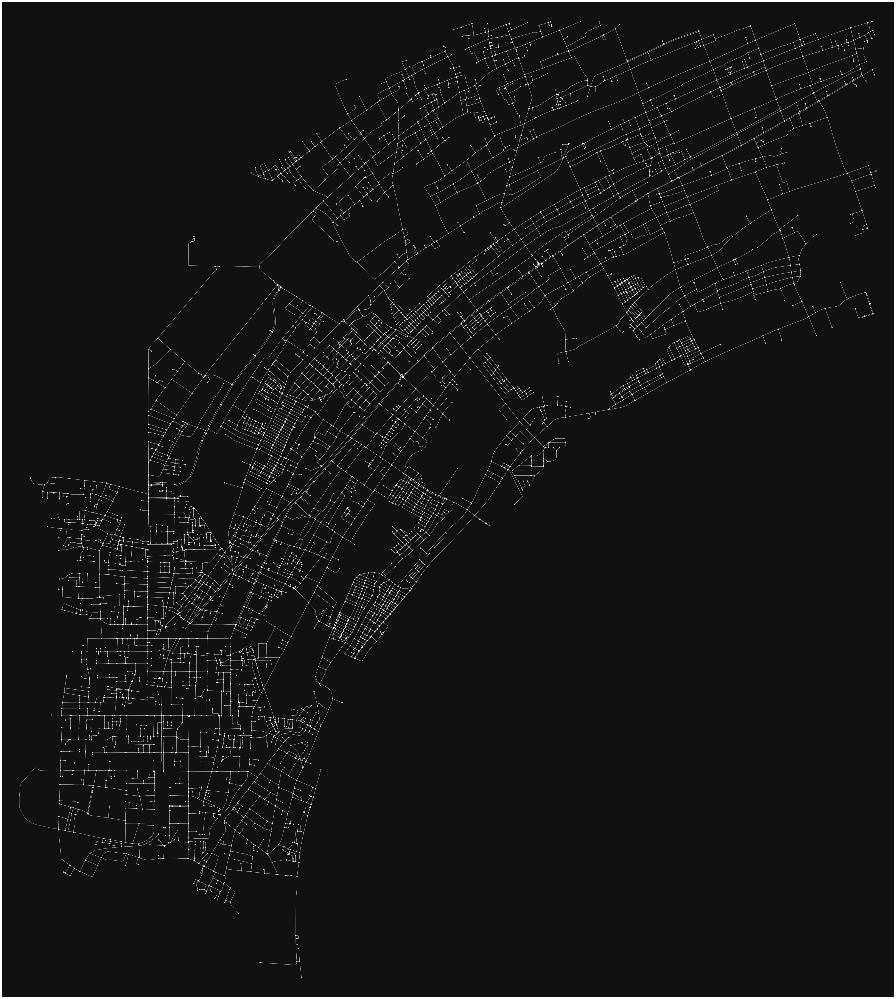

(<Figure size 6000x6000 with 1 Axes>, <Axes: >)

In [3]:
import osmnx as ox
import networkx as nx
G = ox.graph_from_point((-7.7271847, 109.0096620), dist = 7000, network_type="drive")
ox.plot_graph(G, figsize=(60,60))

Menggunakan function nearest_nodes untuk mencari nodes terdekat dari titik awal dan titik tujuan

In [4]:
NodeAwal = ox.nearest_nodes(G, TitikAwal[0],TitikAwal[1]) 
NodeTujuan = ox.nearest_nodes(G, TitikTujuan[1],TitikTujuan[0])

NodeAwal, NodeTujuan

(5901055852, 5925672779)

Membuat function algoritma djikstra

In [5]:
def dijkstra(graph, start, goal, weight='length'):

    queue = [(0, start, [])]
    visited = set()

    while queue:
        (cost, current_node, path) = heapq.heappop(queue)

        if current_node in visited:
            continue
        visited.add(current_node)

        path = path + [current_node]

        if current_node == goal:
            return path, cost

        for neighbor in graph[current_node]:
            if neighbor not in visited:
                edge_weight = graph[current_node][neighbor].get(weight, 1)
                heapq.heappush(queue, (cost + edge_weight, neighbor, path))

    return None, float("inf")


In [13]:
import time
import tracemalloc
import heapq

Menggunakan algortima djikstra untuk mencari rute dan memantau performa algortima

In [15]:
import time
tracemalloc.start()
start_time = time.time()
rute = dijkstra(G, NodeAwal, NodeTujuan, weight="weight")
rute = rute [0]
end_time = time.time()
execution_time = end_time - start_time
current_mem, peak_mem = tracemalloc.get_traced_memory()
tracemalloc.stop()
print(current_mem,peak_mem, execution_time,)

1970 49844 0.0038862228393554688


Visualisasi rute dari titik awal ke titik tujuan

In [16]:
fig ,ax = ox.plot_graph_route(G, rute, route_color="red", figsize=(100,100))

Membuat function untuk algoritma A* dengan heurtistik menggunakan perhitungan jarak haversine

In [17]:
import heapq
from math import radians, sin, cos, sqrt, atan2
import time

nodes, edges = ox.graph_to_gdfs(G, nodes=True, edges=True)
nodes_dict = nodes[['x', 'y']].to_dict('index')

edges_list = [(u, v, data['length']) for u, v, data in G.edges(data=True) if 'length' in data]

def haversine_distance(coord1, coord2):
    R = 6371 
    lat1, lon1 = radians(coord1[1]), radians(coord1[0])
    lat2, lon2 = radians(coord2[1]), radians(coord2[0])
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c * 1000

def a_star_search(NodeAwal, NodeTujuan):
    queue = [(0, NodeAwal)]
    g_cost = {NodeAwal: 0}
    came_from = {NodeAwal: None}

    while queue:
        current_f, current_node = heapq.heappop(queue)

        if current_node == NodeTujuan:
            path = []
            while current_node is not None:
                path.append(current_node)
                current_node = came_from[current_node]
            return path[::-1]

        for u, v, length in edges_list:
            if u == current_node:
                neighbor = v
            elif v == current_node:
                neighbor = u
            else:
                continue

            tentative_g_cost = g_cost[current_node] + length

            if neighbor not in g_cost or tentative_g_cost < g_cost[neighbor]:
                g_cost[neighbor] = tentative_g_cost
                h_cost = haversine_distance(
                    (nodes_dict[neighbor]['x'], nodes_dict[neighbor]['y']),
                    (nodes_dict[NodeTujuan]['x'], nodes_dict[NodeTujuan]['y'])
                )
                f_cost = tentative_g_cost + h_cost
                heapq.heappush(queue, (f_cost, neighbor))
                came_from[neighbor] = current_node

    return None 


Menjalankan algoritma A* dan memantau performanya

In [18]:
start_time = time.time()
tracemalloc.start()
path = a_star_search(NodeAwal, NodeTujuan)
end_time = time.time()
execution_time = end_time - start_time
current_mem, peak_mem = tracemalloc.get_traced_memory()
tracemalloc.stop()
print(current_mem,peak_mem, execution_time)

1997 15733 0.0719139575958252


Visualisasi rute algoritma A*

In [19]:
fig ,ax = ox.plot_graph_route(G, path, route_color="red", figsize=(100,100))

Pemantauan node yang dilalui masing-masing algoritma dan banyak node yang dilalui

In [24]:
print("Dijkstra Path:", rute)
print("A* Path:", path)
print("Panjang langkah Djikstra : ",len(rute))
print("Panjang langkah A* : " ,len(path))

Dijkstra Path: [5901055852, 5901055854, 5901055881, 5901055879, 1087848050, 5901021134, 8594732000, 5901021093, 1087848129, 5901021104, 8576080459, 5925672745, 1087848062, 1087847859, 1087847839, 1077494563, 5925734922, 5925672781, 2251387906, 5925672779]
A* Path: [5901055852, 5901055854, 5901055881, 5901055879, 1087848050, 5901021134, 8594732000, 5901021093, 1087848129, 1097070968, 5901021103, 5901146575, 1077494627, 5925674789, 8576219126, 5925674785, 5925672783, 1077494563, 5925734922, 5925672781, 2251387906, 5925672779]
Panjang langkah Djikstra :  20
Panjang langkah A* :  22


Menunjukkan panjang rute yang sudah dilalui algortima

In [23]:
total_distance = sum(
    G[u][v][0]['length'] for u, v in zip(rute[:-1], rute[1:])
)
print("Panjang Rute Djikstra : ",total_distance)
total_distance = sum(
    G[u][v][0]['length'] for u, v in zip(path[:-1], path[1:])
)
print("Panjang Rute A* : ",total_distance)

Panjang Rute Djikstra :  1916.285
Panjang Rute A* :  1764.2839999999999
